In [1]:
import math
import numpy as np
import torch
import matplotlib.pyplot as plt
from sklearn.metrics.pairwise import cosine_similarity
from utils import model_utils

/datadrive1/ken/miniconda3/envs/videollama/lib/python3.9/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


### Neuro models

In [2]:
model_init, _ = model_utils.load_model_and_tokenizer("gpt2_scratch_neuro_tokenizer_bayes_init")
model_fwd, _ = model_utils.load_model_and_tokenizer("gpt2_scratch_neuro_tokenizer_bayes_fwd")
model_bwd, _ = model_utils.load_model_and_tokenizer("gpt2_scratch_neuro_tokenizer_bayes_rev")
model_perm, _ = model_utils.load_model_and_tokenizer("gpt2_scratch_neuro_tokenizer_bayes_perm")

models = {
    "init": model_init,
    "fwd": model_fwd,
    "bwd": model_bwd,
    "perm": model_perm
}

Loading gpt2 model untrained


/datadrive1/ken/miniconda3/envs/videollama/lib/python3.9/site-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
The argument `trust_remote_code` is to be used with Auto classes. It has no effect here and is ignored.


Loading GPT2 model from /home/ken/projects/backwards/model_training/exp/gpt2_scratch_neuro_tokenizer_bayes_fwd/checkpoint.4


The argument `trust_remote_code` is to be used with Auto classes. It has no effect here and is ignored.


Loading GPT2 model from /home/ken/projects/backwards/model_training/exp/gpt2_scratch_neuro_tokenizer_bayes_rev/checkpoint.4


The argument `trust_remote_code` is to be used with Auto classes. It has no effect here and is ignored.


Loading GPT2 model from /home/ken/projects/backwards/model_training/exp/gpt2_scratch_neuro_tokenizer_bayes_perm/checkpoint.4


In [2]:
def get_pos_embeddings_gpt2(models):
    embeddings = {}
    for model_name, model in models.items():
        with torch.no_grad():
            model.eval()
            embeddings[model_name] = model.transformer.wpe(
                torch.arange(
                    model.transformer.wpe.weight.size(0), 
                    device=model.transformer.wpe.weight.device)
            )
    return embeddings

In [4]:
embeddings = get_pos_embeddings_gpt2(models)

In [3]:
def compute_positional_embedding_similarity_by_distance(positional_embedding_similarities):
    """
    Compute the average cosine similarity for each pair of tokens' positional embeddings
    based on their relative distances in the context window.

    Args:
        positional_embedding_similarities (torch.Tensor): A tensor of shape
            (seq_len, seq_len) containing the pairwise cosine similarities
            of positional embeddings.
    Returns:
        tuple: A tuple containing:
            - unique_distances (torch.Tensor): Unique distances in the lower triangular part.
            - mean_sims (torch.Tensor): Mean similarities for each unique distance.
    """
    positional_embedding_similarities = torch.tensor(positional_embedding_similarities)
    device = positional_embedding_similarities.device
    dtype = positional_embedding_similarities.dtype
    seq_len, _ = positional_embedding_similarities.shape

    # Get lower triangular indices (including diagonal)
    i, j = torch.tril_indices(seq_len, seq_len, device=device)  # i >= j
    distances = torch.abs(i - j)  # Vectorized distance computation

    # Shape: (num_tril_elements)
    sims = positional_embedding_similarities[i, j]

    unique_distances = torch.unique(distances)
    mean_sims = torch.zeros(len(unique_distances), device=device, dtype=dtype)
    for dist in unique_distances:
        mask = distances == dist
        mean_sims[dist] = sims[mask].mean()
    
    return unique_distances, mean_sims

In [4]:
def plot_positional_embeddings_similarities(embeddings):
    num_cols = len(embeddings.keys())
    fig, axes = plt.subplots(1, num_cols, figsize=(num_cols*5, 5), sharey=True, sharex=True)
    if num_cols == 1:
        axes = [axes]
    for ax, (model_name, pos_emb) in zip(axes, embeddings.items()):
        ax.imshow(
            cosine_similarity(pos_emb.cpu().numpy()), 
            cmap="viridis", 
            aspect='equal',
            interpolation='nearest'
        )
        # Add side colorbar
        cbar = plt.colorbar(ax.images[0], ax=ax, fraction=0.046, pad=0.04)
        cbar.ax.tick_params(labelsize=16)

        ax.set_title(model_name.upper(), fontsize=22)
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_xlabel("Token Position", fontsize=22)
        ax.set_ylabel("Token Position", fontsize=22)
    fig.tight_layout()
    return fig

def plot_positional_embeddings_similarities_by_distance(embeddings):
    fig, ax = plt.subplots(figsize=(4, 3))
    lw = plt.rcParams['lines.linewidth'] ** 0.5
    s = plt.rcParams['lines.markersize'] ** 0.5
    alpha = 0.8

    for model_name, pos_emb in embeddings.items():
        unique_distances, mean_sims = compute_positional_embedding_similarity_by_distance(
            cosine_similarity(pos_emb.cpu().numpy())
        )
        
        ax.plot(
            unique_distances, mean_sims, label=model_name.upper(), 
            lw=lw, alpha=alpha, 
        )

    ax.set_xlabel("Distance")
    ax.set_ylabel("Mean Cosine Similarity")
    ax.set_ylim(-1.05, 1.05)
    ax.axhline(0, color='grey', alpha=0.5, lw=1)
    ax.grid(True, linestyle='--', alpha=0.5)
    ax.legend()
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    fig.tight_layout()
    return fig

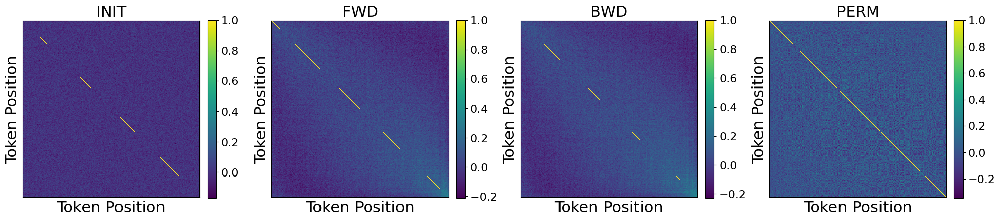

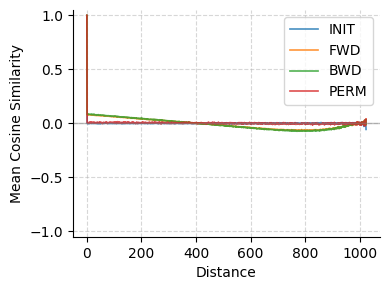

In [7]:
fig = plot_positional_embeddings_similarities(embeddings)
fig.savefig("figs/pos_embd/positional_embedding_similarity_x_models.png")

fig = plot_positional_embeddings_similarities_by_distance(embeddings)
fig.savefig("figs/pos_embd/positional_embedding_similarity_by_distance_x_models.png")

### Replot with position adjustment

In [8]:
# Reorder positions of bwd model, except for the first position (BOS)
embeddings["bwd"] = torch.cat(
    [embeddings["bwd"][:1], torch.flip(embeddings["bwd"][1:], dims=[0])],
    dim=0
)

# Reorder positions of perm model, except for the first position (BOS)
# [1:] rows need to be reordered by `unperm_indices`
perm_random_seed = 1
np.random.seed(perm_random_seed)
perm_indices = np.random.permutation(
    torch.arange(embeddings["fwd"].size(0)-1, device="cpu")
)
unperm_indices = torch.tensor(perm_indices).argsort()

embeddings["perm"] = torch.cat(
    [embeddings["perm"][:1], embeddings["perm"][1:][unperm_indices]],
    dim=0
)

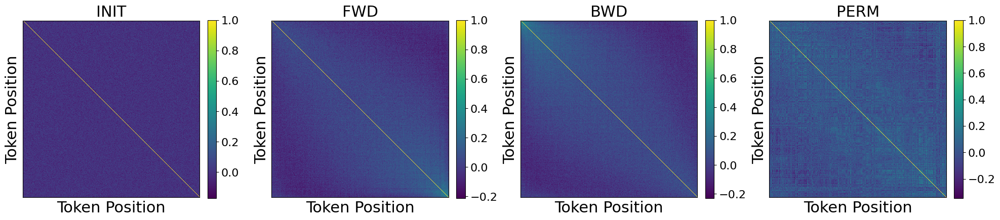

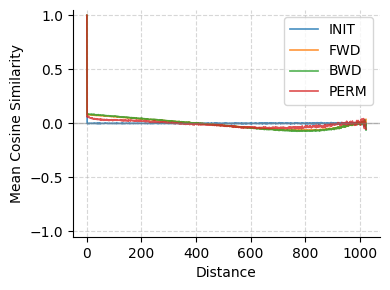

In [9]:
fig = plot_positional_embeddings_similarities(embeddings)
fig.savefig("figs/pos_embd/positional_embedding_similarity_x_models_reordered.png")

fig = plot_positional_embeddings_similarities_by_distance(embeddings)
fig.savefig("figs/pos_embd/positional_embedding_similarity_by_distance_x_models_reordered.png")

In [10]:
del model_init
del model_fwd, model_bwd, model_perm
del embeddings

### GPT-2 pretrained models

In [7]:
model_gpt2_124m, _ = model_utils.load_model_and_tokenizer("gpt2")
model_gpt2_355m, _ = model_utils.load_model_and_tokenizer("gpt2-medium")
model_gpt2_774m, _ = model_utils.load_model_and_tokenizer("gpt2-large")
model_gpt2_1_5b, _ = model_utils.load_model_and_tokenizer("gpt2-xl")

models_gpt2 = {
    "gpt2-124m": model_gpt2_124m,
    "gpt2-355m": model_gpt2_355m,
    "gpt2-774m": model_gpt2_774m,
    "gpt2-1.5b": model_gpt2_1_5b
}

In [8]:
embeddings_gpt2 = get_pos_embeddings_gpt2(models_gpt2)

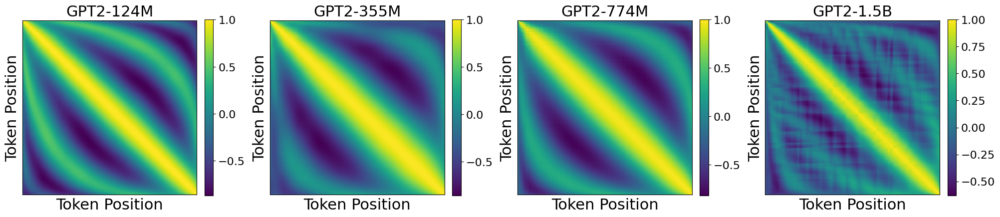

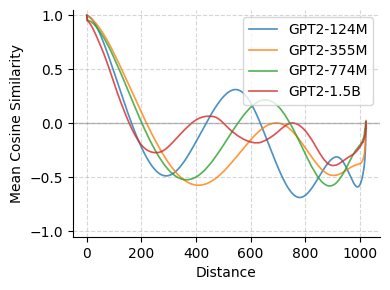

In [9]:
fig = plot_positional_embeddings_similarities(embeddings_gpt2)
fig.savefig("figs/pos_embd/positional_embedding_similarity_gpt2_pretrained.png")

fig = plot_positional_embeddings_similarities_by_distance(embeddings_gpt2)
fig.savefig("figs/pos_embd/positional_embedding_similarity_by_distance_gpt2_pretrained.png")

In [14]:
model_gpt2_124m.to('cpu')
model_gpt2_355m.to('cpu')
model_gpt2_774m.to('cpu')

del model_gpt2_124m, model_gpt2_355m, model_gpt2_774m

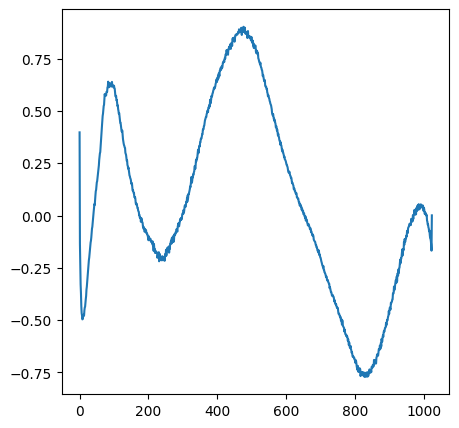

In [15]:
embeddings_gpt2["gpt2-124m"].shape
fig, ax = plt.subplots(figsize=(5, 5))
ax.plot(embeddings_gpt2["gpt2-124m"][:, 49].cpu().numpy(), label="gpt2-124m", linewidth=1.5)

### DialoGPT (GPT-2 arch)

In [10]:
model_dialogpt_small, _ = model_utils.load_model_and_tokenizer("microsoft/dialogpt-small")
model_dialogpt_medium, _ = model_utils.load_model_and_tokenizer("microsoft/dialogpt-medium")
model_dialogpt_large, _ = model_utils.load_model_and_tokenizer("microsoft/dialogpt-large")
models_dialogpt = {
    "dialogpt-small": model_dialogpt_small,
    "dialogpt-medium": model_dialogpt_medium,
    "dialogpt-large": model_dialogpt_large
}

/datadrive1/ken/miniconda3/envs/videollama/lib/python3.9/site-packages/torch/_utils.py:776: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  return self.fget.__get__(instance, owner)()


In [11]:
embeddings_dialogpt = get_pos_embeddings_gpt2(models_dialogpt)

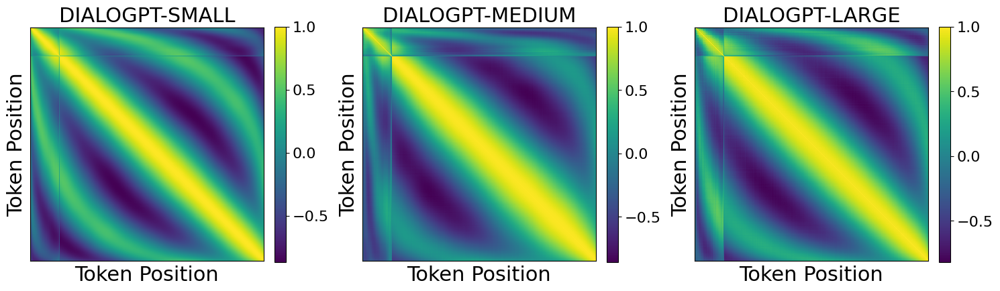

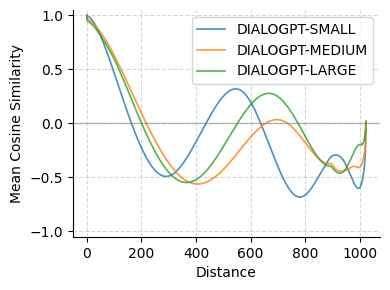

In [21]:
fig = plot_positional_embeddings_similarities(embeddings_dialogpt)
fig.savefig("figs/pos_embd/positional_embedding_similarity_dialogpt.png")

fig = plot_positional_embeddings_similarities_by_distance(embeddings_dialogpt)
fig.savefig("figs/pos_embd/positional_embedding_similarity_by_distance_dialogpt.png")

### CodeParrot (GPT-2 arch)

In [5]:
model_codeparrot_small, _ = model_utils.load_model_and_tokenizer("codeparrot/codeparrot-small")
model_codeparrot, _ = model_utils.load_model_and_tokenizer("codeparrot/codeparrot")
models_codeparrot = {
    "codeparrot-110m": model_codeparrot_small,
    "codeparrot-1.5b": model_codeparrot
}

/datadrive1/ken/miniconda3/envs/videollama/lib/python3.9/site-packages/torch/_utils.py:776: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  return self.fget.__get__(instance, owner)()
/datadrive1/ken/miniconda3/envs/videollama/lib/python3.9/site-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


In [6]:
embeddings_codeparrot = get_pos_embeddings_gpt2(models_codeparrot)

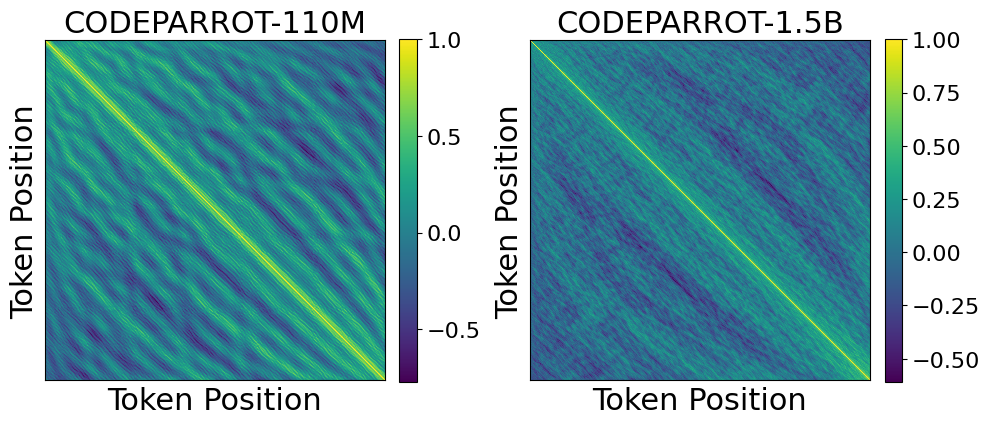

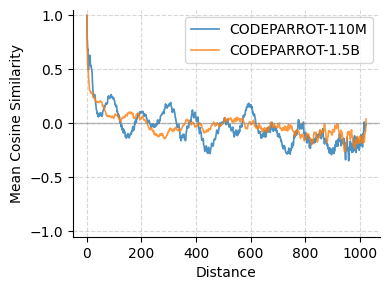

In [7]:
fig = plot_positional_embeddings_similarities(embeddings_codeparrot)
fig.savefig("figs/pos_embd/positional_embedding_similarity_codeparrot.png")

fig = plot_positional_embeddings_similarities_by_distance(embeddings_codeparrot)
fig.savefig("figs/pos_embd/positional_embedding_similarity_by_distance_codeparrot.png")

### Mission impossible models:

In [22]:
model_no_reverse, _ = model_utils.load_model_and_tokenizer("mission-impossible-lms/no-reverse-gpt2")
model_full_reverse, _ = model_utils.load_model_and_tokenizer("mission-impossible-lms/full-reverse-gpt2")
model_non_detershuffle, _ = model_utils.load_model_and_tokenizer("mission-impossible-lms/nondeterministic-shuffle-gpt2")
model_detershuffle, _ = model_utils.load_model_and_tokenizer("mission-impossible-lms/deterministic-shuffle-s21-gpt2")

models_mission_imp = {
    "no-reverse": model_no_reverse,
    "full-reverse": model_full_reverse,
    "non-detershuffle": model_non_detershuffle,
    "deter-shuffle": model_detershuffle
}

In [23]:
embeddings_mission_imp = get_pos_embeddings_gpt2(models_mission_imp)

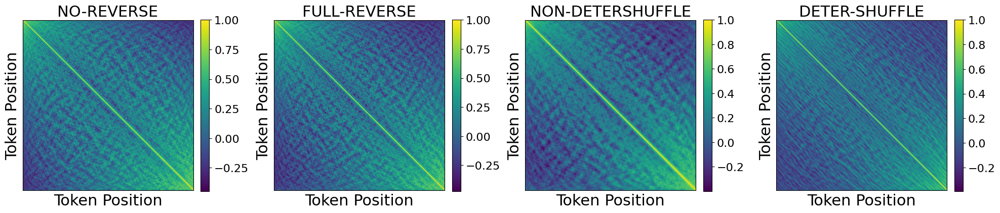

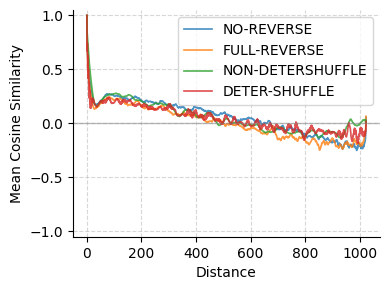

In [24]:
fig = plot_positional_embeddings_similarities(embeddings_mission_imp)
fig.savefig("figs/pos_embd/positional_embedding_similarity_gpt2_missionimp.png")

fig = plot_positional_embeddings_similarities_by_distance(embeddings_mission_imp)
fig.savefig("figs/pos_embd/positional_embedding_similarity_by_distance_gpt2_missionimp.png")

### OPT models

In [8]:
model_opt_125m, _ = model_utils.load_model_and_tokenizer("facebook/opt-125m")
model_opt_350m, _ = model_utils.load_model_and_tokenizer("facebook/opt-350m")
model_opt_1_3b, _ = model_utils.load_model_and_tokenizer("facebook/opt-1.3b")
model_opt_2_7b, _ = model_utils.load_model_and_tokenizer("facebook/opt-2.7b")
model_opt_6_7b, _ = model_utils.load_model_and_tokenizer("facebook/opt-6.7b")
models_opt = {
    "opt-125m": model_opt_125m,
    "opt-350m": model_opt_350m,
    "opt-1.3b": model_opt_1_3b,
    "opt-2.7b": model_opt_2_7b,
    "opt-6.7b": model_opt_6_7b
}

/datadrive1/ken/miniconda3/envs/videollama/lib/python3.9/site-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
Loading checkpoint shards: 100%|██████████| 2/2 [00:02<00:00,  1.31s/it]


In [9]:
def get_pos_embeddings_opt(models):
    embeddings = {}
    for model_name, model in models.items():
        with torch.no_grad():
            model.eval()
            position_embedding_weights = model.model.decoder.embed_positions.weight.detach()
            embeddings[model_name] = position_embedding_weights
    return embeddings

In [10]:
embeddings_opt = get_pos_embeddings_opt(models_opt)

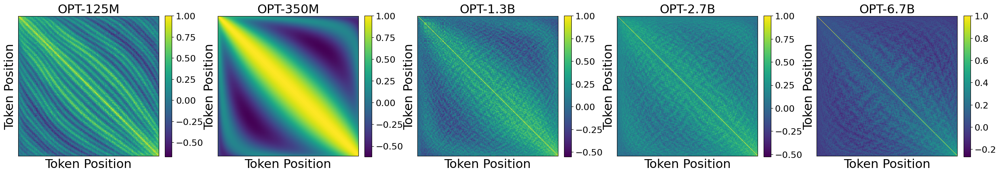

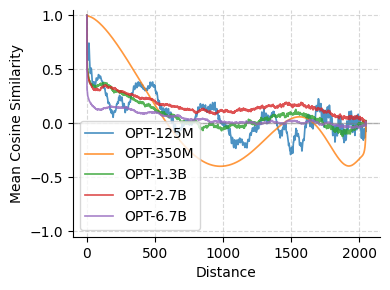

In [11]:
fig = plot_positional_embeddings_similarities(embeddings_opt)
fig.savefig("figs/pos_embd/positional_embedding_similarity_opt.png")

fig = plot_positional_embeddings_similarities_by_distance(embeddings_opt)
fig.savefig("figs/pos_embd/positional_embedding_similarity_by_distance_opt.png")

### Galactica models

In [12]:
model_galactica_125m, _ = model_utils.load_model_and_tokenizer("facebook/galactica-125m")
model_galactica_1_3b, _ = model_utils.load_model_and_tokenizer("facebook/galactica-1.3b")
model_galactica_6_7b, _ = model_utils.load_model_and_tokenizer("facebook/galactica-6.7b")

models_galactica = {
    "galactica-125m": model_galactica_125m,
    "galactica-1.3b": model_galactica_1_3b,
    "galactica-6.7b": model_galactica_6_7b,

}

/datadrive1/ken/miniconda3/envs/videollama/lib/python3.9/site-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
Loading checkpoint shards: 100%|██████████| 2/2 [00:54<00:00, 27.11s/it]


In [13]:
def get_pos_embeddings_galactica(models):
    embeddings = {}
    for model_name, model in models.items():
        with torch.no_grad():
            model.eval()
            position_embedding_weights = model.model.decoder.embed_positions.weight.detach()
            embeddings[model_name] = position_embedding_weights
    return embeddings

embeddings_galactica = get_pos_embeddings_galactica(models_galactica)

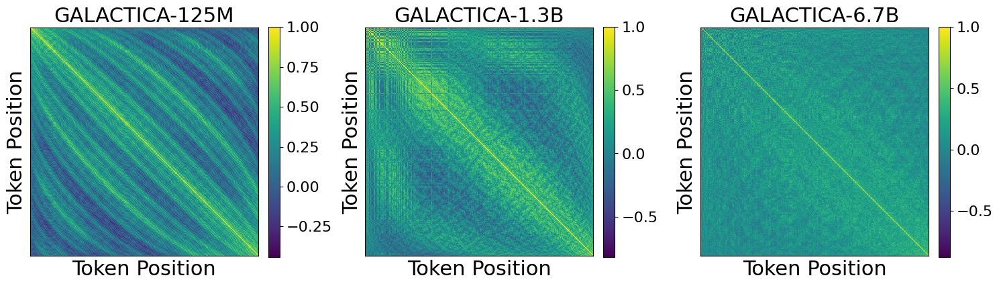

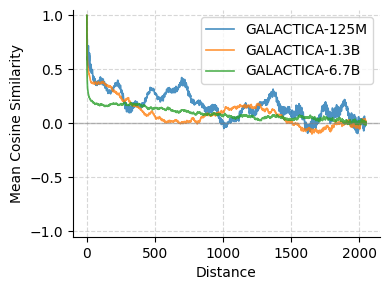

In [14]:
fig = plot_positional_embeddings_similarities(embeddings_galactica)
fig.savefig("figs/pos_embd/positional_embedding_similarity_galactica.png")

fig = plot_positional_embeddings_similarities_by_distance(embeddings_galactica)
fig.savefig("figs/pos_embd/positional_embedding_similarity_by_distance_galactica.png")

### Side-investigate: Why GPT2 small and DialoGPT small sim so similar?

In [ ]:
# Why GPT2 small and DialoGPT small sim so similar?
gpt2_small_emb = embeddings_gpt2["gpt2-124m"]
dialogpt_small_emb = embeddings_dialogpt["dialogpt-small"]
codeparrot_small_emb = embeddings_codeparrot["codeparrot-small"]

# get correlation for flattened embs
gpt2_small_emb_flat = gpt2_small_emb.flatten().cpu().numpy()
dialogpt_small_emb_flat = dialogpt_small_emb.flatten().cpu().numpy()
codeparrot_small_emb_flat = codeparrot_small_emb.flatten().cpu().numpy()
corr = np.corrcoef(gpt2_small_emb_flat, dialogpt_small_emb_flat)[0, 1]
print(f"Correlation between GPT2 small and DialoGPT small positional embeddings: {corr:.4f}")

corr = np.corrcoef(gpt2_small_emb_flat, codeparrot_small_emb_flat)[0, 1]
print(f"Correlation between GPT2 small and CodeParrot small positional embeddings: {corr:.4f}")
corr = np.corrcoef(dialogpt_small_emb_flat, codeparrot_small_emb_flat)[0, 1]

# lets look at each model's token embeddings
gpt2_small_tok_emb = model_gpt2_124m.transformer.wte.weight
dialogpt_small_tok_emb = model_dialogpt_small.transformer.wte.weight
codeparrot_small_tok_emb = model_codeparrot_small.transformer.wte.weight

# get correlation for flattened embs
gpt2_small_tok_emb_flat = gpt2_small_tok_emb.detach().cpu().numpy().flatten()
dialogpt_small_tok_emb_flat = dialogpt_small_tok_emb.flatten().detach().cpu().numpy().flatten()
codeparrot_small_tok_emb_flat = codeparrot_small_tok_emb.detach().cpu().numpy().flatten()
corr = np.corrcoef(gpt2_small_tok_emb_flat, dialogpt_small_tok_emb_flat)[0, 1]
print(f"Correlation between GPT2 small and DialoGPT small token embeddings: {corr:.4f}")

# Check vocabs
print(model_gpt2_124m.config.vocab_size)
print(model_dialogpt_small.config.vocab_size)
print(model_codeparrot_small.config.vocab_size)

# Check if actual vocabs of model_gpt2_124m and model_dialogpt_small are the same
from transformers import AutoTokenizer
gpt2_tokenizer = AutoTokenizer.from_pretrained("gpt2")
dialogpt_tokenizer = AutoTokenizer.from_pretrained("microsoft/dialogpt-small")
gpt2_vocab = gpt2_tokenizer.get_vocab()
dialogpt_vocab = dialogpt_tokenizer.get_vocab()

gpt2_vocab.keys() == dialogpt_vocab.keys()  # Check if keys are the same

Correlation between GPT2 small and DialoGPT small positional embeddings: 0.9952
Correlation between GPT2 small and CodeParrot small positional embeddings: 0.0035
Correlation between GPT2 small and DialoGPT small token embeddings: 0.9271
50257
50257
32768


True

The argument `trust_remote_code` is to be used with Auto classes. It has no effect here and is ignored.


Loading GPT2 model from /home/ken/projects/matching_experts/model_training/exp/gpt2_scratch/checkpoint.4


True

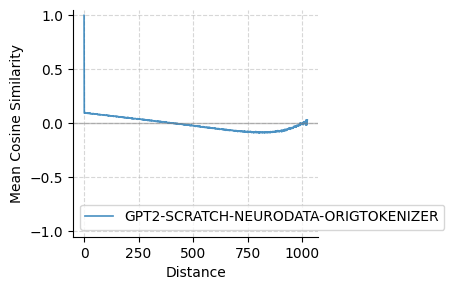

In [57]:
# TODO: I have a wild guess that it has a lot to do with tokenization and vocab,
# to test the idea, didn't we have the gpt2 using original tokenizer and trained on neuroscience?
from importlib import reload
from utils import model_utils
reload(model_utils)
model_gpt2_scratch_neurodata_origtokenizer, tokenizer = model_utils.load_model_and_tokenizer("gpt2_scratch")
models_gpt2_scratch_neurodata_origtokenizer = {
    "gpt2-scratch-neurodata-origtokenizer": model_gpt2_scratch_neurodata_origtokenizer
}
embeddings_gpt2_scratch_neurodata_origtokenizer = get_pos_embeddings_gpt2(models_gpt2_scratch_neurodata_origtokenizer)
fig = plot_positional_embeddings_similarities_by_distance(embeddings_gpt2_scratch_neurodata_origtokenizer)

tokenizer.get_vocab().keys() == gpt2_vocab.keys()  # Check if keys are the same

### BERT models

In [32]:
from transformers import AutoModelForMaskedLM

In [33]:
model_bert_uncased_110m = AutoModelForMaskedLM.from_pretrained("bert-base-uncased")
model_bert_uncased_340m = AutoModelForMaskedLM.from_pretrained("bert-large-uncased")
model_bert_multilingual_110m = AutoModelForMaskedLM.from_pretrained("bert-base-multilingual-cased")

models_bert = {
    "bert-uncased-110m": model_bert_uncased_110m,
    "bert-uncased-340m": model_bert_uncased_340m,
    "bert-multilingual-110m": model_bert_multilingual_110m
}

Some weights of the model checkpoint at bert-base-uncased were not used when initializing BertForMaskedLM: ['bert.pooler.dense.bias', 'bert.pooler.dense.weight', 'cls.seq_relationship.bias', 'cls.seq_relationship.weight']
- This IS expected if you are initializing BertForMaskedLM from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertForMaskedLM from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of the model checkpoint at bert-large-uncased were not used when initializing BertForMaskedLM: ['bert.pooler.dense.bias', 'bert.pooler.dense.weight', 'cls.seq_relationship.bias', 'cls.seq_relationship.weight']
- This IS expected if you are initializing BertForMaskedLM from the checkpoint of a model 

In [34]:
def get_pos_embeddings_bert(models):
    embeddings = {}
    for model_name, model in models.items():
        with torch.no_grad():
            model.eval()
            position_embedding_weights = model.bert.embeddings.position_embeddings.weight.detach()
            embeddings[model_name] = position_embedding_weights
    return embeddings

embeddings_bert = get_pos_embeddings_bert(models_bert)

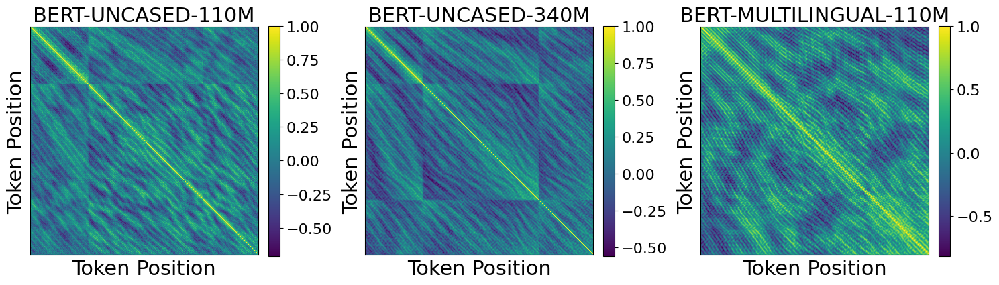

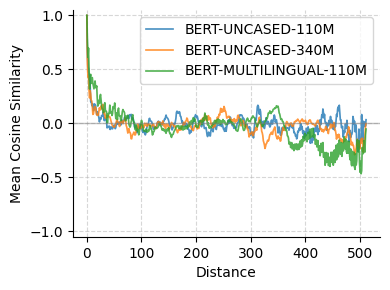

In [35]:
fig = plot_positional_embeddings_similarities(embeddings_bert)
fig.savefig("figs/pos_embd/positional_embedding_similarity_bert.png")

fig = plot_positional_embeddings_similarities_by_distance(embeddings_bert)
fig.savefig("figs/pos_embd/positional_embedding_similarity_by_distance_bert.png")

### Fixed position encoding models (vanilla transformer?)

In [36]:
d_model = 768
max_seq_length = 1024
        
# Pre-compute position encodings
pe = torch.zeros(max_seq_length, d_model)
position = torch.arange(0, max_seq_length).unsqueeze(1).float()

# Calculate div_term for the sinusoidal pattern
div_term = torch.exp(torch.arange(0, d_model, 2).float() * 
                    -(math.log(10000.0) / d_model))

# Apply sin to even indices, cos to odd indices
pe[:, 0::2] = torch.sin(position * div_term)
pe[:, 1::2] = torch.cos(position * div_term)

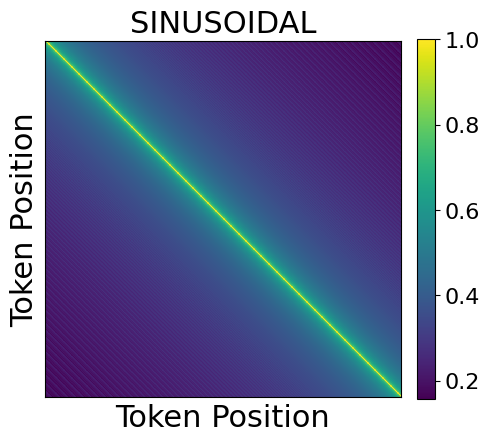

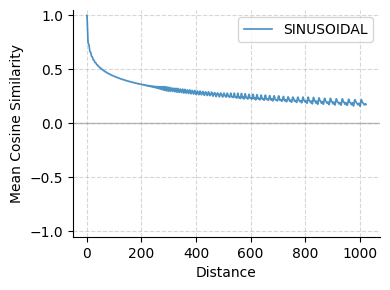

In [37]:
fig = plot_positional_embeddings_similarities(embeddings={"sinusoidal": pe})
fig.savefig("figs/pos_embd/positional_embedding_similarity_sinusoidal.png")
fig = plot_positional_embeddings_similarities_by_distance(embeddings={"sinusoidal": pe})
fig.savefig("figs/pos_embd/positional_embedding_similarity_by_distance_sinusoidal.png")